# Advanced Lane Finding Project


 Importing all necessary libraries:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import glob
import cv2
import pickle

# Camera calibration

In [2]:
nx = 9 #the number of inside corners in x
ny = 6 #the number of inside corners in y
    
def camera_chessboard_calibration(image, imname, nx, ny):
    
    img = np.copy(image)
    h, w = img.shape[:2]
    dist = []
    mtx = []
    objpoints = []
    imgpoints = []
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)        
    # Converting to grayscale:   
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners:
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    # If found, draw corners
    if ret == True:
    # Draw and display the corners
        objpoints.append(objp)
        imgpoints.append(corners)
        et, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        #distortion correction:  
        undist = cv2.undistort(img, mtx, dist, None, mtx)
        #draw detected corners:
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    else:
        undist = img
        
    return img,mtx,dist,ret

### Testing on images:

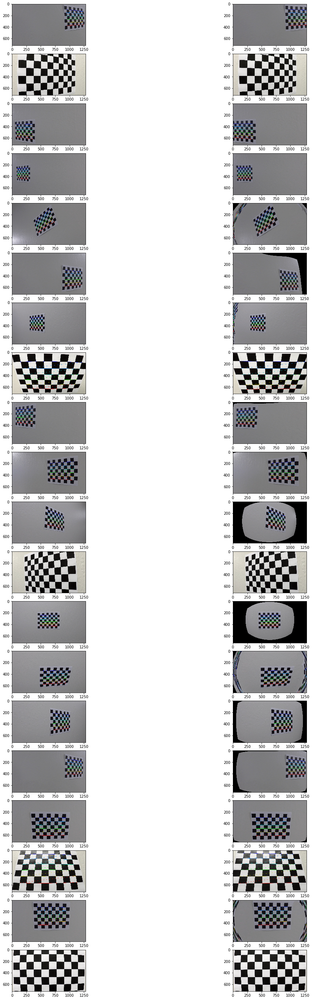

In [3]:
import os
images = os.listdir("camera_cal/")

rows = len(images)
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(20, 50))

for i in range(0,len(images)):
    imname  = "camera_cal/" + images[i]
    image = mpimg.imread(imname)
    img,mtx,dist,ret = camera_chessboard_calibration(image,imname,nx,ny)
    if(ret == True):
       undist = cv2.undistort(img, mtx, dist, None, mtx)      
    else:
        undist = img
    axes[i,0].imshow(img)
    axes[i,1].imshow(undist)    
plt.show()

### Calibration matrix and distortion coefficients for further usage:

In [4]:
for i in range(0,len(images)):
    imname  = "camera_cal/" + images[i]
    image = mpimg.imread(imname)
    img,mtx,dist,ret = camera_chessboard_calibration(image,imname,nx,ny)
    if(ret == True):
        img_cp = np.copy(image)
        undist = cv2.undistort(img_cp, mtx, dist, None, mtx)
        calibration_mtx = mtx
        dist_coeff = dist
        cv2.imwrite("./output_images/chessboard_distorted.png", undist)
        cv2.imwrite("./output_images/chessboard_undist.png", undist)
        break;
        
image_road = mpimg.imread("./test_images/straight_lines1.jpg")  
undist_road = cv2.undistort( np.copy(image_road), mtx, dist, None, mtx)
cv2.imwrite("./output_images/straight_lines1_undist.jpg", cv2.cvtColor(image_road, cv2.COLOR_RGB2BGR))
        

True

# Region of interest & Perspective transform

In [5]:
def perspective_transform(image):
    img = np.copy(image)
    height = img.shape[0]
    width = img.shape[1]
    offset = 100
    # Points in the source image:
    src_points = np.array([[(width // 2 - 76, height * 0.625), 
                          (width // 2 + 76, height * 0.625), (offset,height),(width,height)]], dtype=np.float32)
    # Points in the destination image:
    dst_points = np.array([[(offset, 0), 
                          (width-offset, 0), (offset,height), (width-offset,height)]], dtype=np.float32)
    # Given src and dst points we calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src_points, dst_points)
    # Warp the image
    warped = cv2.warpPerspective(img, M, (width, height))
    # We also calculate the oposite transform
    unwrap_m = cv2.getPerspectiveTransform(dst_points, src_points)
    return warped, unwrap_m

# Gradients and color transforms

In [6]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    # Apply threshold
    img = np.copy(img)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):  
    img = np.copy(img)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    img = np.copy(image)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)    
    grad_dir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(grad_dir)
    binary_output[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    return binary_output

def hls_threshold(image, s_thresh=(0, 255),h_thresh=(0, 255)):
    img = np.copy(image)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    h_channel = hls[:,:,0]
    binary_output = np.zeros_like(s_channel)
    binary_output[((s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])) & ((h_channel > h_thresh[0]) & (h_channel <= h_thresh[1]))] = 1
    return binary_output

In [7]:
def edges_pipeline(img):
    image_dist = np.copy(img)
    ksize = 3 # Choose a Sobel kernel size
    image = cv2.undistort(image_dist, calibration_mtx, dist_coeff, None, calibration_mtx)
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel = ksize, thresh=(50,150))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel = ksize, thresh=(20,250))
    mag_binary = mag_thresh(image, sobel_kernel = ksize, mag_thresh=(50,200))
    dir_binary = dir_threshold(image, sobel_kernel = ksize, thresh=(0.7,1.3))
    hls_binary = hls_threshold(image, s_thresh=(100, 250),h_thresh=(10, 50))
    combined = np.zeros_like(dir_binary)
    combined[((hls_binary == 1) | (mag_binary == 1) & (gradx == 1) & (grady == 1) & (dir_binary == 1))] = 1
    return combined
    

### Testing thresholding and perspective transform to bird-eye view:

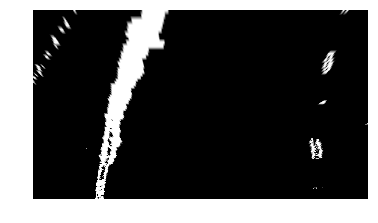

In [42]:
test_images = os.listdir("test_images/")
imname  = "test_images/" + test_images[0]
image = mpimg.imread(imname)
combined_thresh = edges_pipeline(image)
bird_eye, M = perspective_transform(combined_thresh)
plt.imshow(bird_eye,cmap='Greys_r') 
plt.axis('off')
plt.show()

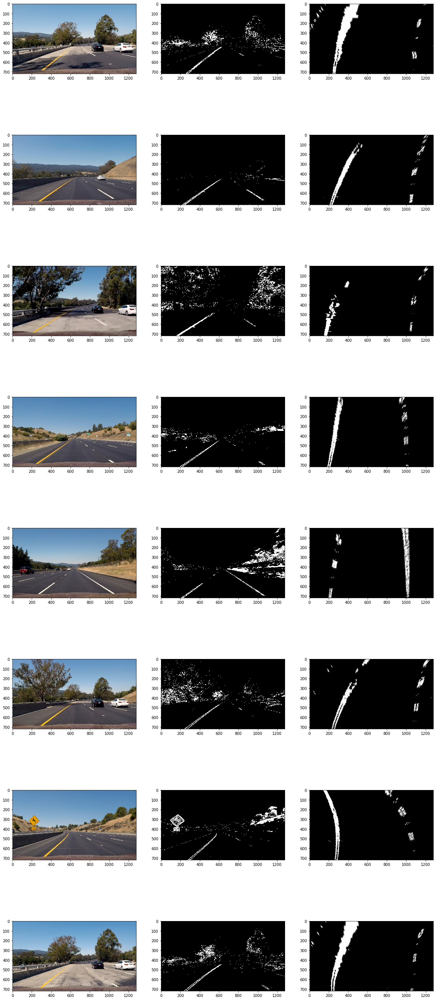

In [8]:
test_images = os.listdir("test_images/")
rows = len(test_images)
fig, axes = plt.subplots(nrows=rows, ncols=3, figsize=(20, 50))

for i in range(0,len(test_images)):
    imname  = "test_images/" + test_images[i]
    image = mpimg.imread(imname)
    #image = cv2.undistort(img, MTX, DIST, None, MTX)
    combined_thresh = edges_pipeline(image)
    bird_eye, M = perspective_transform(combined_thresh)
    axes[i,0].imshow(image)
    axes[i,1].imshow(combined_thresh,cmap='Greys_r') 
    axes[i,2].imshow(bird_eye,cmap='Greys_r') 
plt.show()

# Histogram peaks & sliding window

In [9]:
def find_lane_pixels(binary_warped):
    lane_detected = True
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    #out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    out_img = np.dstack((binary_warped, binary_warped,binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        #Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(255,50,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(255,50,0), 3) 
                 
        #Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        #
        #If you found > minpix pixels, recenter next window ###
        #(`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    #if((not leftx) | (not lefty)):
    if((not leftx.any())|(not lefty.any())|(not rightx.any())|(not righty.any())):
        lane_detected = False
        
    return leftx, lefty, rightx, righty, out_img, lane_detected


def fit_polynomial(binary_in):
    binary_warped = np.copy(binary_in)
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img, detected = find_lane_pixels(binary_warped)
    # Fit a second order polynomial 
    if (detected):
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            detected = False
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty
            # Colors in the left and right lane regions (visualization)
        out_img[lefty, leftx] = [50, 250, 70]
        out_img[righty, rightx] = [250, 70, 50]
    else:
        leftx = []
        lefty = []
        rightx = []
        righty = []
        out_img = []
        left_fitx = []
        right_fitx = []
        left_fit = []
        right_fit = []
        ploty = []
        out_img  = np.copy(binary_in)
    
    return out_img,left_fitx,right_fitx,left_fit,right_fit,ploty,detected

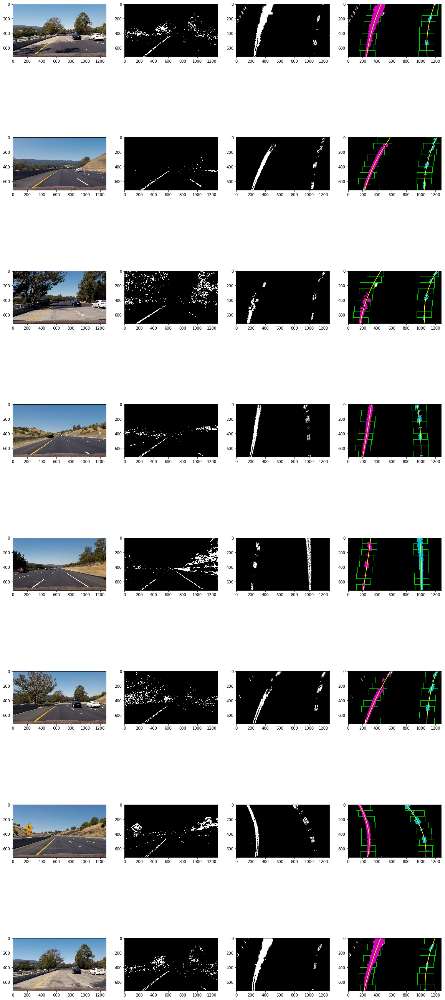

In [10]:
test_images = os.listdir("test_images/")
rows = len(test_images)
fig, axes = plt.subplots(nrows=rows, ncols=4, figsize=(20, 50))

for i in range(0,len(test_images)):
#for i in range(0,2):
    imname  = "test_images/" + test_images[i]
    image = mpimg.imread(imname)
    combined_thresh = edges_pipeline(image)
    bird_eye, M = perspective_transform(combined_thresh)
    poly_img,left_fitx,right_fitx,left_fit,right_fit,ploty,detected = fit_polynomial(bird_eye)
    #skip_img,left_fitx_s,right_fitx_s,ploty_s = search_around_poly(bird_eye,left_fit,right_fit)
    axes[i,0].imshow(image)
    axes[i,1].imshow(combined_thresh,cmap='Greys_r') 
    axes[i,2].imshow(bird_eye,cmap='Greys_r') 
    axes[i,3].imshow(poly_img) 
    axes[i,3].plot(left_fitx, ploty, color='yellow')
    axes[i,3].plot(right_fitx, ploty, color='yellow')
plt.show()

# Skip the sliding windows

In [11]:

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    # Fit a second order polynomial to each
    right_fit = np.polyfit(righty, rightx, 2)
    left_fit = np.polyfit(lefty, leftx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    # Calc both polynomials using ploty, left_fit and right_fit
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit):
    
    # The width of the margin around the previous polynomial to search
    margin = 100
    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    #Set the area of search based on activated x-values
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] =  [50, 250, 70]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [250, 70, 50]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.1, 0)
        
    return result,left_fitx,right_fitx,ploty

# Computing radius of curvature

In [12]:
def measure_curvature_real(ploty,left_fitx_s,right_fitx_s,img_size):

    #Calculates the curvature of polynomial functions in meters.
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
       
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx_s*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx_s*xm_per_pix, 2)
        
    # Define y-value where we want radius of curvature Choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    avg_curverad = (left_curverad + right_curverad)*0.5
    
    # Calculate the offset from the center
    left_lane_y = (left_fit_cr[0]**2)*y_eval+left_fit_cr[1]*y_eval+left_fit_cr[2]
    right_lane_y = (right_fit_cr[0]**2)*y_eval+right_fit_cr[1]*y_eval+right_fit_cr[2]
    lane_center = (right_lane_y + left_lane_y)*0.5
    center_offset_pixels = (abs(img_size*0.5 - lane_center))
    center_offset_mtrs = xm_per_pix*center_offset_pixels*0.5
        
    return avg_curverad,center_offset_mtrs

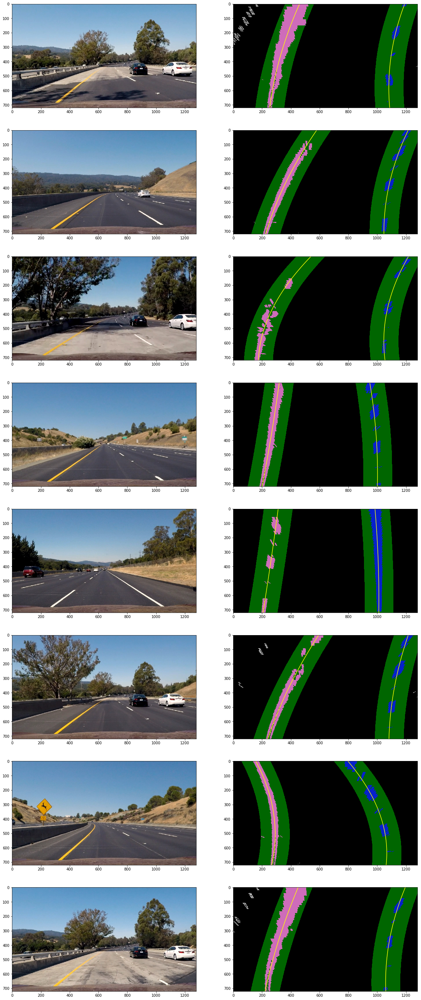

In [13]:
test_images = os.listdir("test_images/")
rows = len(test_images)
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(20, 50))

for i in range(0,len(test_images)):
#for i in range(0,2):
    imname  = "test_images/" + test_images[i]
    image = mpimg.imread(imname)
    combined_thresh = edges_pipeline(image)
    bird_eye, M = perspective_transform(combined_thresh)
    poly_img,left_fitx,right_fitx,left_fit,right_fit,ploty,lane_detected = fit_polynomial(bird_eye)
    skip_img,left_fitx,right_fitx,ploty = search_around_poly(bird_eye,left_fit,right_fit)
    axes[i,0].imshow(image)
    axes[i,1].imshow(skip_img) 
    axes[i,1].plot(left_fitx, ploty, color='yellow')
    axes[i,1].plot(right_fitx, ploty, color='yellow')
plt.show()

# Inverse Transform

In [14]:
def inverse_transform(warped,ploty_s,left_fitx_s,right_fitx_s):
    color_warp = np.zeros_like(warped).astype(np.uint8)
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx_s, ploty_s]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx_s, ploty_s])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,250,50))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M, (warped.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(warped, 1, newwarp, .3, 0)
    
    return result


# Testing on images:

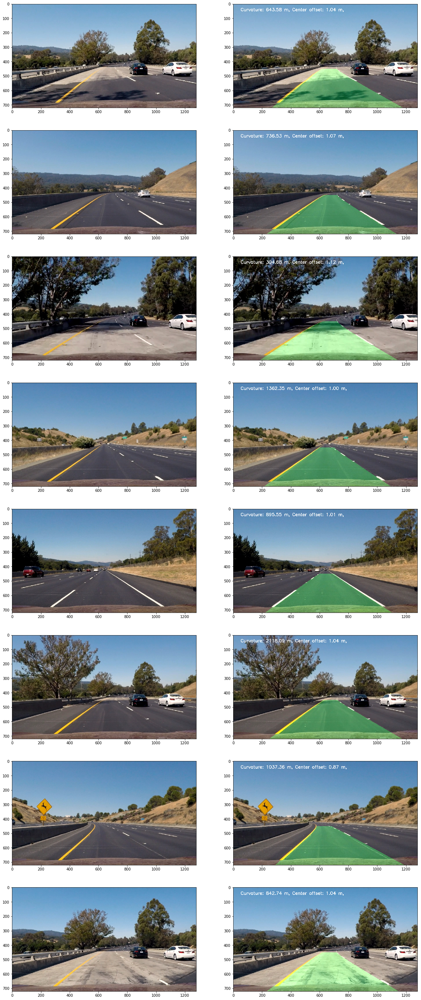

In [15]:
test_images = os.listdir("test_images/")
rows = len(test_images)
fig, axes = plt.subplots(nrows=rows, ncols=2, figsize=(20, 50))
lane_detected = False

for i in range(0,len(test_images)):
    imname  = "test_images/" + test_images[i]
    image = mpimg.imread(imname)
    combined_thresh = edges_pipeline(image)
    bird_eye, M = perspective_transform(combined_thresh)
    if (lane_detected == False):
        result,left_fitx,right_fitx,left_fit,right_fit,ploty,lane_detected = fit_polynomial(bird_eye)
    else:
        result,left_fitx,right_fitx,ploty = search_around_poly(bird_eye,left_fit,right_fit)
    result = inverse_transform(image,ploty,left_fitx,right_fitx)
    avg_curverad,center_offset = measure_curvature_real(ploty,left_fitx,right_fitx,result.shape[0])
    stats_text = 'Curvature: {0:.2f} m,'.format(avg_curverad) + ' Center offset: {0:.2f} m,'.format(center_offset)
    text_offset = 50
    text_shift = 1
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, stats_text, \
                (text_offset + text_shift, text_offset + text_shift), \
                font, 1, (255, 255, 255), 2, cv2.LINE_AA)
    axes[i,0].imshow(image)
    axes[i,1].imshow(result) 
plt.show()

# Testing in video

In [20]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [37]:
#@staticmethod
def process_image(image):
    global lane_detected
    lane_detected = False
    combined_thresh = edges_pipeline(image)
    bird_eye, M = perspective_transform(combined_thresh)
    if (lane_detected == False):
        img_poly,left_fitx,right_fitx,left_fit,right_fit,ploty,lane_detected = fit_polynomial(bird_eye)
    else:
        img_poly,left_fitx,right_fitx,ploty = search_around_poly(bird_eye,left_fit,right_fit)
    result = inverse_transform(image,ploty,left_fitx,right_fitx)
    avg_curverad,center_offset = measure_curvature_real(ploty,left_fitx,right_fitx,result.shape[0])
    stats_text = 'Curvature: {0:.1f} m,'.format(avg_curverad) + ' Center offset: {0:.1f} m,'.format(center_offset)
    text_offset = 50
    text_shift = 1
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, stats_text, \
                (text_offset + text_shift, text_offset + text_shift), \
                font, 1, (255, 255, 255), 2, cv2.LINE_AA)
    return result

In [38]:
white_output = 'video_lanes_detected.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video video_lanes_detected.mp4
[MoviePy] Writing video video_lanes_detected.mp4


100%|█████████▉| 1260/1261 [06:49<00:00,  3.29it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_lanes_detected.mp4 

CPU times: user 4min 34s, sys: 940 ms, total: 4min 35s
Wall time: 6min 52s


In [39]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))